# Cluster lensing with a full light cone of source galaxies

This notebook shows how to simulate cluster lenses with a full background of source galaxies.

Currently the cluster deflector data comes from the redMaPPer catalog, but in the future this notebook will be extended to use SLHammock deflectors. 

For demonstration purposes, images are rendered for the Roman satellite as they are sharper and the lensing effects are more clearly visible.

In [1]:
import slsim.Sources as sources
import slsim.Pipelines as pipelines
import slsim.Deflectors as deflectors

from slsim.Lenses.lens_pop import LensPop
from slsim.Lenses.lens import Lens

from slsim.Plots.lens_plots import LensingPlots

import numpy as np
import matplotlib.pyplot as plt
from astropy.units import Quantity
from astropy.cosmology import FlatLambdaCDM
from astropy.table import Table

from slsim.Pipelines import roman_speclite
import speclite

import warnings

**WARNING**: LOCAL JWST PRD VERSION PRDOPSSOC-072 DOESN'T MATCH THE CURRENT ONLINE VERSION PRDOPSSOC-073
Please consider updating pysiaf, e.g. pip install --upgrade pysiaf or conda update pysiaf


In [2]:
warnings.filterwarnings("ignore")
plt.rcParams["figure.dpi"] = 200

In [3]:
# Configure roman rendering
roman_speclite.configure_roman_filters()
roman_filters = roman_speclite.filter_names()
speclite.filters.load_filters(*roman_filters)

In [ ]:
cosmo = FlatLambdaCDM(H0=70, Om0=0.3)

sky_area = Quantity(value=0.05, unit="deg2")

kwargs_deflector_cut = {"band": "g", "band_max": 27, "z_min": 0.2, "z_max": 1.0}
kwargs_source_cut = {"band": "g", "band_max": 27, "z_min": 0.21, "z_max": 5.0}

galaxy_simulation_pipeline = pipelines.SkyPyPipeline(
    skypy_config="../data/SkyPy/roman-lsst-like.yml",  # Have SkyPy generate appropriate magnitudes for roman bands
    sky_area=sky_area,
)

# Use both red and blue galaxies as source / field galaxies
source_galaxies = sources.Galaxies(
    galaxy_list=galaxy_simulation_pipeline.all_galaxies,
    kwargs_cut=kwargs_source_cut,
    cosmo=cosmo,
    sky_area=sky_area,
    catalog_type="skypy",
)

In [ ]:
# Read catalog data and initialize cluster deflectors

cluster_catalog = Table.read("../data/redMaPPer/clusters_example.fits")
members_catalog = Table.read("../data/redMaPPer/members_example.fits")

lens_clusters = deflectors.ClusterDeflectors(
    cluster_list=cluster_catalog,
    members_list=members_catalog,
    galaxy_list=galaxy_simulation_pipeline.all_galaxies,
    kwargs_cut=kwargs_deflector_cut,
    cosmo=cosmo,
    sky_area=sky_area,
    kwargs_mass2light={},
    kwargs_draw_members={"max_dist": 350},
)

In [ ]:
# Some plotting functions


def plot_objects(lens_cluster_class: Lens, ax):
    """
    Plot locations of source galaxies, deflector galaxies, and field galaxies in the source plane. Expects the deflector to be a cluster.

    :param lens_cluster_class: slsim.Lenses.Lens
    :param ax: matplotlib.axes.Axes
    """
    source_class = lens_cluster_class._source
    field_class = lens_cluster_class._field_galaxies
    deflector = lens_cluster_class.deflector._deflector

    ax.scatter(
        [s.deflector_center[0] for s in deflector._subhalos],
        [s.deflector_center[1] for s in deflector._subhalos],
        label="deflectors",
        alpha=0.5,
        s=10,
        color="red",
    )
    ax.scatter(
        [s.extended_source_position[0] for s in field_class],
        [s.extended_source_position[1] for s in field_class],
        label="field galaxies",
        alpha=0.5,
        s=10,
        color="yellow",
    )
    ax.scatter(
        [s.extended_source_position[0] for s in source_class],
        [s.extended_source_position[1] for s in source_class],
        label="sources",
        alpha=0.5,
        s=10,
        color="blue",
    )


def plot_source_position_shift(lens_cluster_class: Lens, ax):
    """
    Plots the image position shift of sources.

    :param lens_cluster_class: slsim.Lenses.Lens
    :param ax: matplotlib.axes.Axes
    """
    source_class = lens_cluster_class._source
    image_positions = lens_cluster_class.extended_source_image_positions

    multi_imaged = 0
    for i in range(len(source_class)):
        if len(image_positions[i][0]) <= 1:
            color = "pink"
            lw = 0.25
        else:
            colors = "cmyrgb"
            color = colors[multi_imaged % len(colors)]
            multi_imaged += 1

            lw = 1.0

        for j in range(len(image_positions[i][0])):
            ax.plot(
                [source_class[i].extended_source_position[0], image_positions[i][0][j]],
                [source_class[i].extended_source_position[1], image_positions[i][1][j]],
                color=color,
                alpha=0.5,
                lw=lw,
            )


def plot_caustics(lens_cluster_class: Lens, ax):
    """
    Plot caustic curves of lens_cluster_class at a high redshift.

    :param lens_cluster_class: slsim.Lenses.Lens
    :param ax: matplotlib.axes.Axes
    """

    deflector = lens_cluster_class.deflector
    _, _, ra_caustic_list, dec_caustic_list = deflector.critical_curves_caustics_list(
        10, cosmo, {"compute_window": 80, "grid_scale": 0.5}
    )

    label = "caustics"
    for ra, dec in zip(ra_caustic_list, dec_caustic_list):
        ax.plot(ra, dec, color="green", lw=0.75, label=label)
        label = None

### Draw random cluster-source field lenses with multiply imaged sources

In [ ]:
lenspop = LensPop(
    deflector_population=lens_clusters,
    source_population=source_galaxies,
    cosmo=cosmo,
    sky_area=sky_area,
)

RENDER_WIDTH = 80
render_area = Quantity(np.pi * (RENDER_WIDTH * 0.707) ** 2, "arcsec2")
cluster_lens_plot = LensingPlots(
    lenspop, num_pix=int(RENDER_WIDTH / 0.11), observatory="Roman"
)  # pixel scale is 0.11 arcsecs for Roman - make total image width 80 arcsecs

kwargs_lens_cut_plot = {
    "min_image_separation": 1.0,
    "max_image_separation": 100.0,
    # "mag_arc_limit": {"g": 22, "r": 22, "i": 22},
}

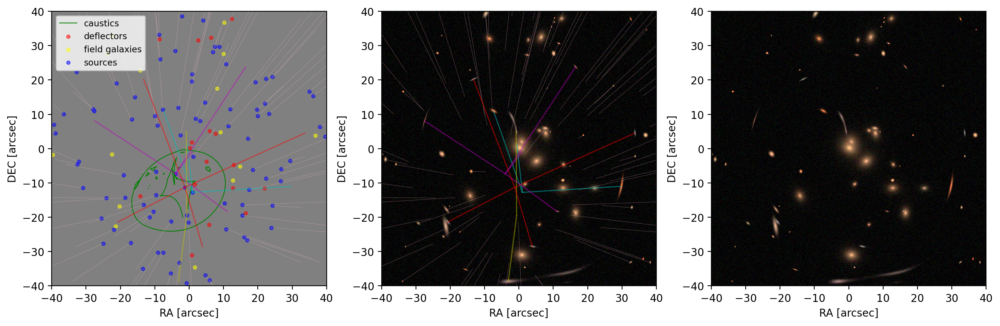

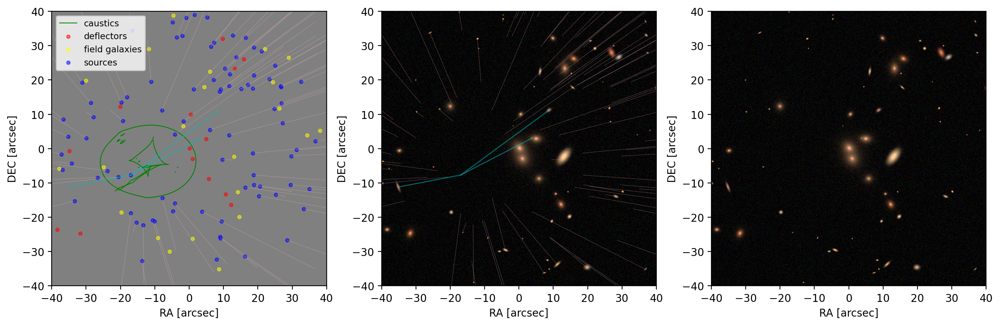

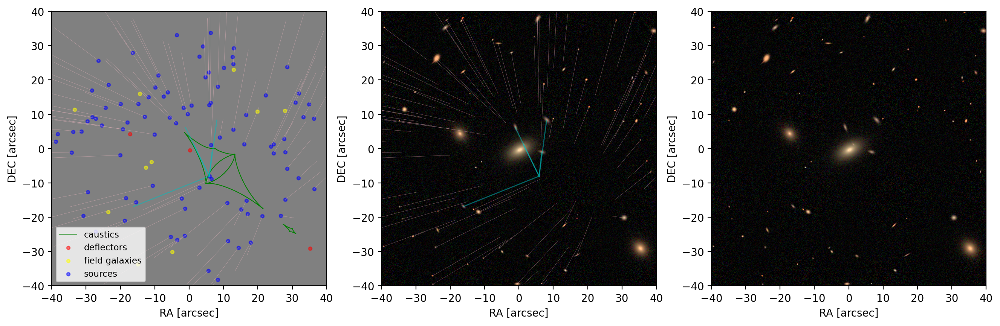

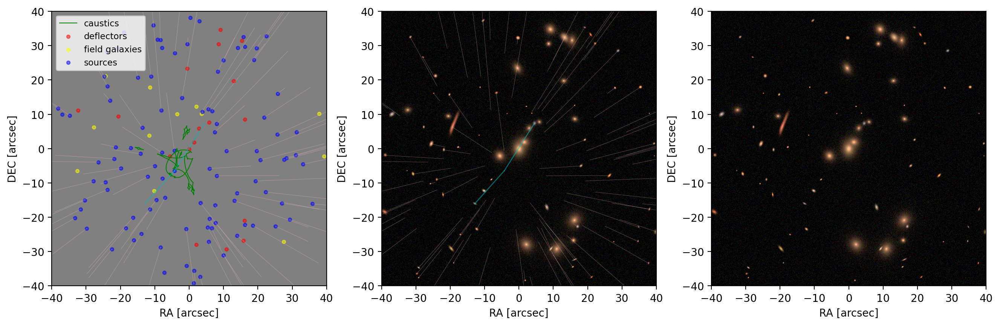

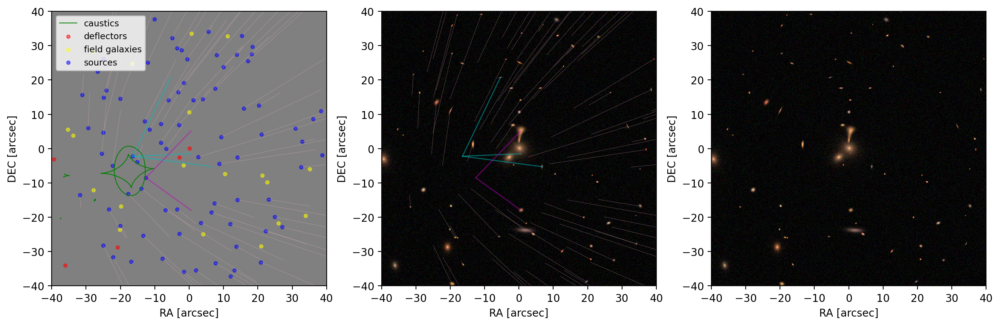

In [58]:
for i in range(5):
    lens_cluster_class = lenspop.select_lens_at_random_multi_source(
        render_area, **kwargs_lens_cut_plot
    )

    image_rgb = cluster_lens_plot.rgb_image(
        lens_class=lens_cluster_class,
        rgb_band_list=["F158", "F129", "F106"],
        add_noise=True,
    )

    fig, (ax1, ax2, ax3) = plt.subplots(1, 3, figsize=(16, 16))

    plt.setp(
        (ax1, ax2, ax3),
        xlim=(-RENDER_WIDTH / 2, RENDER_WIDTH / 2),
        ylim=(-RENDER_WIDTH / 2, RENDER_WIDTH / 2),
        xlabel="RA [arcsec]",
        ylabel="DEC [arcsec]",
        aspect="equal",
    )

    plot_caustics(lens_cluster_class, ax1)
    plot_objects(lens_cluster_class, ax1)
    plot_source_position_shift(lens_cluster_class, ax1)
    ax1.legend(fontsize="small")
    ax1.set_facecolor("gray")

    ax2.imshow(image_rgb, origin="lower", extent=[-40, 40, -40, 40])
    plot_source_position_shift(lens_cluster_class, ax2)

    ax3.imshow(image_rgb, origin="lower", extent=[-40, 40, -40, 40])

    plt.show()

### Draw a cluster lens with at least 3 multiply imaged sources

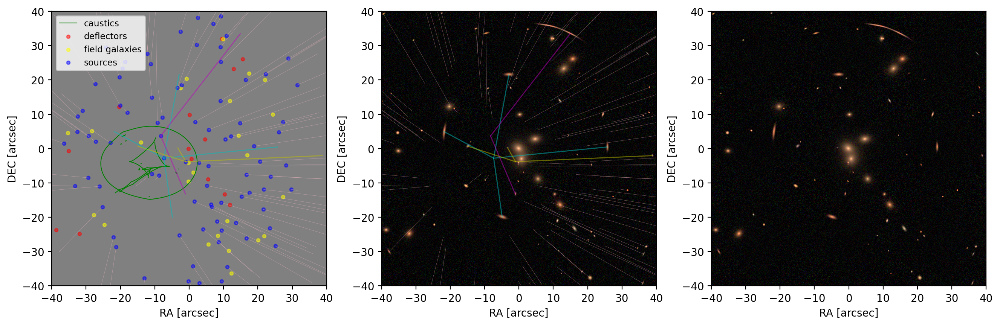

In [59]:
lens_cluster_class = lenspop.select_lens_at_random_multi_source(
    render_area, min_num_sources=3, **kwargs_lens_cut_plot
)

image_rgb = cluster_lens_plot.rgb_image(
    lens_class=lens_cluster_class,
    rgb_band_list=["F158", "F129", "F106"],
    add_noise=True,
)

fig, (ax1, ax2, ax3) = plt.subplots(1, 3, figsize=(16, 16))

plt.setp(
    (ax1, ax2, ax3),
    xlim=(-RENDER_WIDTH / 2, RENDER_WIDTH / 2),
    ylim=(-RENDER_WIDTH / 2, RENDER_WIDTH / 2),
    xlabel="RA [arcsec]",
    ylabel="DEC [arcsec]",
    aspect="equal",
)

plot_caustics(lens_cluster_class, ax1)
plot_objects(lens_cluster_class, ax1)
plot_source_position_shift(lens_cluster_class, ax1)
ax1.legend(fontsize="small")
ax1.set_facecolor("gray")

ax2.imshow(image_rgb, origin="lower", extent=[-40, 40, -40, 40])
plot_source_position_shift(lens_cluster_class, ax2)

ax3.imshow(image_rgb, origin="lower", extent=[-40, 40, -40, 40])

plt.show()